In [19]:
%matplotlib inline
import matplotlib.pyplot as plt

In [28]:
import geopandas as gpd
import pandas as pd
import numpy as np
import pysal as ps

from region.p_regions.azp import AZP
from region.p_regions.azp import AZPSimulatedAnnealing
from region.p_regions.exact import PRegionsExact
from region.max_p_regions.exact import MaxPRegionsExact
from region.max_p_regions.heuristics import MaxPRegionsHeu


In [21]:
attrs = pd.read_csv('data/la_data.csv', converters={'geoid': str}) 
attrs.set_index('geoid', inplace=True)
attrs.sort_index(inplace=True)
cols = attrs.columns.tolist()
attrs.reset_index(inplace=True)
shp = gpd.GeoDataFrame.from_file('data/la_msa.shp') # need to 

In [22]:
# make sure geo and attribute data are in same order to avoid linking weights by ID
attrs.sort_index(inplace=True)
shp.set_index('GEOID', inplace=True)
shp.sort_index(inplace=True)
shp.reset_index(inplace=True)

In [23]:
dat = shp.merge(attrs, left_index=True, right_index=True)

In [24]:
dat['ones'] = 1

### Max-P (Heurestic)


In [25]:
%%time
maxp_heu = MaxPRegionsHeu()
maxp_heu.fit_from_geodataframe(gdf=dat, attr=cols, spatially_extensive_attr='ones', threshold=50, contiguity="queen")

f_f_SCIPY got:
[[0.21932146 0.55679934 0.01451945 ... 0.44320066 0.16168801 0.18231188]
 [0.30779616 0.75235491 0.00514908 ... 0.24764509 0.40020105 0.25391985]
 [0.1879898  0.41703502 0.03783616 ... 0.58296498 0.11461295 0.15487472]
 ...
 [0.6434095  0.19315554 0.00243809 ... 0.80684446 0.26301378 0.28346755]
 [0.27736745 0.0757608  0.10361859 ... 0.9242392  0.17898363 0.20542743]
 [0.40230905 0.26269316 0.01670869 ... 0.73730684 0.29546831 0.19522644]]
[[1]
 [1]
 [1]
 ...
 [1]
 [1]
 [1]]
50
[{128, 129, 133, 134, 136, 8, 27, 28, 15, 16, 17, 19, 20, 21, 22, 23, 152, 153, 154, 25, 26, 29, 158, 31, 160, 161, 162, 163, 164, 165, 166, 34, 35, 169, 170, 171, 172, 42, 41, 46, 48, 43, 50, 47, 44, 45, 36, 56, 58, 59, 188, 37, 38, 33, 69, 70, 39, 40, 32, 985, 986, 987, 988, 150, 30, 24, 126, 127}, {1554, 672, 674, 675, 676, 682, 683, 684, 685, 686, 687, 688, 689, 1856, 707, 708, 709, 710, 712, 713, 714, 715, 716, 717, 723, 725, 728, 730, 731, 734, 735, 608, 609, 738, 739, 740, 741, 742, 743, 74

### AZP

In [26]:
%%time
azp = AZP()
azp.fit_from_geodataframe(gdf=dat, attr=cols, n_regions=15, contiguity="queen")

n_regions_per_comp {0: 15}
comp_label 0
n_regions_in_comp 15
Regions in comp: {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14}
start with obj. val.: [[3052715.43323631]]
RN {0: {5, 1029, 1031, 9, 13, 14, 1039, 16, 17, 1042, 1043, 20, 22, 23, 1073, 51, 53, 54, 2101, 57, 2106, 2107, 2108, 2109, 62, 63, 2116, 2120, 2125, 2127, 2130, 2131, 2139, 2148, 2149, 2150, 1124, 1125, 1129, 2154, 2155, 2159, 1137, 1139, 1140, 2167, 1145, 1146, 2172, 1152, 1153, 2194, 2198, 2200, 2202, 2203, 2205, 2207, 1246, 1252, 1253, 1254, 1255, 1259, 1260, 1274, 1276, 1277, 1278, 1279, 1285, 1287, 1288, 1290, 1292, 1293, 1312, 1314, 1315, 1330, 1333, 1334, 1335, 1336, 1338, 1360, 1362, 1363, 1372, 1376, 1378, 1380, 926, 927, 962, 986, 988, 1011}, 1: {0, 2176, 2, 3, 4, 2179, 2178, 256, 2184, 258, 262, 11, 12, 263, 270, 15, 272, 273, 18, 19, 274, 21, 149, 278, 279, 2201, 282, 155, 156, 283, 284, 159, 2199, 925, 2210, 926, 292, 169, 937, 938, 49, 50, 178, 56, 184, 59, 187, 189, 190, 2109, 193, 203, 971, 972, 973,

### AZP-SA

In [29]:
%%time
azpsa = AZPSimulatedAnnealing()
azpsa.fit_from_geodataframe(gdf=dat, attr=cols, n_regions=15, contiguity="queen")

NotImplementedError: TODO

---

** Note: The "Exact" solutions don't reach convergence after 1.5 days on my laptop **


### Max-P (Exact)

In [ ]:
%%time
maxp = MaxPRegionsExact()
maxp.fit_from_geodataframe(gdf=dat, attr=cols, spatially_extensive_attr='ones', threshold=50, solver='gurobi', contiguity="queen")

### P-Regions (Exact)

In [ ]:
%%time
preg = PRegionsExact()
preg.fit_from_geodataframe(gdf=dat, attr=cols, n_regions=15, method='tree', solver='gurobi', contiguity="queen")

---


NameError: name 'azpsa' is not defined

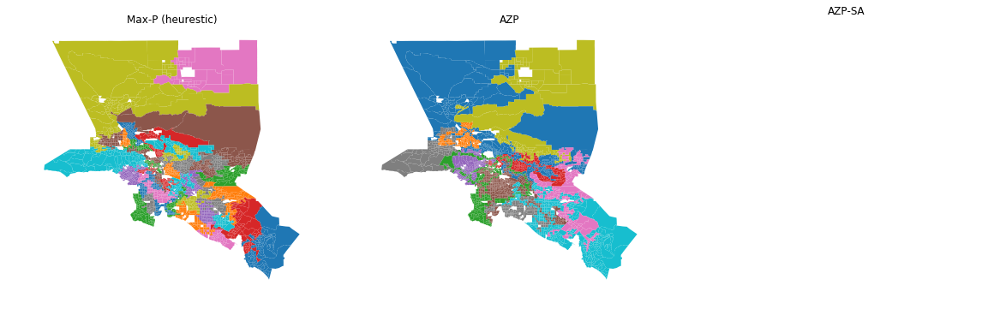

In [31]:
fig, ((ax1, ax2, ax3)) = plt.subplots(1,3, figsize=(20,10))

ax1.set_aspect('equal')
ax1.axis('off')
ax1.set_title("Max-P (heurestic)")

ax2.set_aspect('equal')
ax2.axis('off')
ax2.set_title("AZP")

ax3.set_aspect('equal')
ax3.axis('off')
ax3.set_title("AZP-SA")


dat.assign(c=maxp_heu.labels_).plot(column='c', categorical=True, ax=ax1)
dat.assign(c=azp.labels_).plot(column='c', categorical=True, ax=ax2)
dat.assign(c=azpsa.labels_).plot(column='c', categorical=True, ax=ax3)




---

### Thoughts:

- the biggest hurdle has been the weights matrix. If, for some reason, W is improperly specified the algos run and it's impossible to diagnose if there's an error. A common example is when creating a W-matrix from a geopandas dataframe that includes a named index (like a FIPS code for a census shapefile). Usually the W object  fails to align. 

    From what I can tell, the W is in the appropriate shape and possibly even the appropriate **orde**r, but indices are retained in W (i.e. rows are named) but dropped in the cluster design matrix. I think pysal does a check for appropriate dimensions of W, so in this case it might make sense to include a check for index alignment. In the long run, more integration with (geo)pandas could ensure a proper join, but that (presumably) would require conversion of pysal infrastructure from numpy to pandas

- I think it would make sense to allow the floor variable to be created internally when specifying a the spatially_contiguous_variable as the minimum region size. i.e. rather than creating a 'ones' column, there could be a flag for `region threshold` or something, which, when set to True, creates the ones column. I just imagine this being a common use case and it would be simpler to provide the functionality internally.